Mobile Net V2 with cutmix applied:

Epoch 1/5: 100%|██████████| 225/225 [02:41<00:00,  1.39it/s]


Epoch 1: Train Acc: 54.28%, Val Acc: 95.20%


Epoch 2/5: 100%|██████████| 225/225 [02:28<00:00,  1.51it/s]


Epoch 2: Train Acc: 72.57%, Val Acc: 96.00%


Epoch 3/5: 100%|██████████| 225/225 [03:08<00:00,  1.19it/s]


Epoch 3: Train Acc: 76.00%, Val Acc: 96.40%


Epoch 4/5: 100%|██████████| 225/225 [03:17<00:00,  1.14it/s]


Epoch 4: Train Acc: 76.65%, Val Acc: 95.60%


Epoch 5/5: 100%|██████████| 225/225 [02:27<00:00,  1.52it/s]


Epoch 5: Train Acc: 77.42%, Val Acc: 96.80%


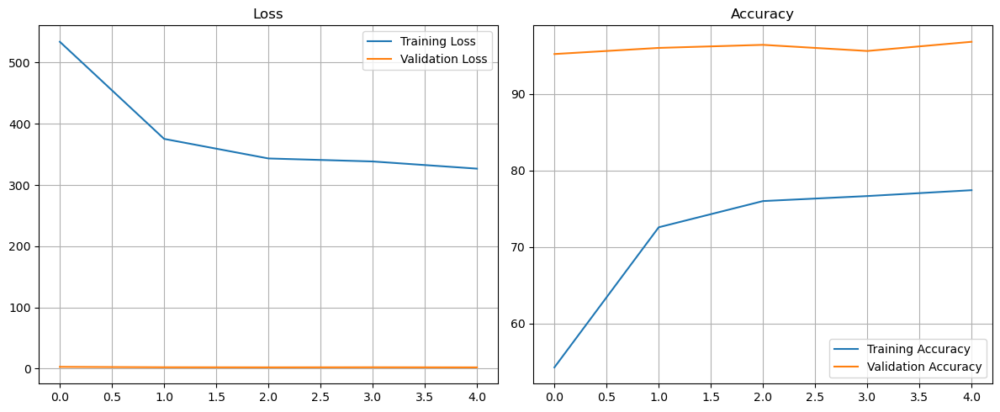

Test Accuracy: 98.00%
Classification Report:
                           precision    recall  f1-score   support

     ARCIGERA FLOWER MOTH       1.00      0.80      0.89         5
               ATLAS MOTH       1.00      1.00      1.00         5
        BANDED TIGER MOTH       1.00      1.00      1.00         5
  BIRD CHERRY ERMINE MOTH       1.00      1.00      1.00         5
        BLACK RUSTIC MOTH       1.00      1.00      1.00         5
             BLAIRS MOCHA       1.00      0.80      0.89         5
    BLOTCHED EMERALD MOTH       1.00      1.00      1.00         5
BLUE BORDERED CARPET MOTH       1.00      1.00      1.00         5
            CINNABAR MOTH       1.00      1.00      1.00         5
           CLEARWING MOTH       1.00      0.80      0.89         5
               COMET MOTH       1.00      1.00      1.00         5
    DEATHS HEAD HAWK MOTH       1.00      1.00      1.00         5
       ELEPHANT HAWK MOTH       1.00      0.80      0.89         5
         EMPEROR

In [18]:
# Import necessary programmes
from pathlib import Path
import os

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tqdm import tqdm
from PIL import Image
import random

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader

from torchvision import transforms, datasets, models
from torchvision.models import MobileNet_V2_Weights
from torchvision.transforms.v2 import CutMix  # Add CutMix import

# Set seed for reproducibility
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# Device - tells PyTorch code to automatically select GPU if available, otherwise use CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define Paths
data_root = Path("../data/kaggle-dataset/archive")

# Transforms - loads default pretrained weights for MobileNetV2 (trained on ImageNet)
weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()

# Dictionary-style dataset and dataloader setup
data_transforms = {
    'train': transform,
    'valid': transform,
    'test': transform
}

image_datasets = {
    split: datasets.ImageFolder(os.path.join(data_root, split), transform=data_transforms[split])
    for split in ['train', 'valid', 'test']
}

class_names = image_datasets['train'].classes
num_classes = len(class_names)

# CutMix setup
cutmix = CutMix(num_classes=num_classes)

def cutmix_collate(batch):
    imgs, targets = zip(*batch)
    imgs = torch.stack(imgs)
    targets = torch.tensor(targets)
    imgs, targets = cutmix(imgs, targets)
    return imgs, targets

# DataLoaders - only training uses CutMix
dataloaders = {
    'train': DataLoader(image_datasets['train'], batch_size=32, shuffle=True, 
                       num_workers=0, collate_fn=cutmix_collate),  # CutMix for training only
    'valid': DataLoader(image_datasets['valid'], batch_size=32, shuffle=False, num_workers=4),
    'test': DataLoader(image_datasets['test'], batch_size=32, shuffle=False, num_workers=4)
}

# Load MobileNetV2 model with pretrained weights
model = models.mobilenet_v2(weights=weights)
# Replace just the final classification layer 
model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)

# unfreeze the last block only
for name, param in model.named_parameters():
    # Unfreeze only features.18 (last block) + classifier
    if "features.18" in name or "classifier" in name:
        param.requires_grad = True
    else:
        param.requires_grad = False

model.to(device)

# Loss and optimiser for calculating error and adjusting for model improvement
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-3, weight_decay=1e-4)

# Training
train_loss_list, val_loss_list = [], []
train_acc_list, val_acc_list = [], []
epochs = 5

for epoch in range(epochs):
    model.train()
    total_loss, total_correct, total_samples = 0, 0, 0

    for x, y in tqdm(dataloaders['train'], desc=f"Epoch {epoch+1}/{epochs}"):
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        output = model(x)
        loss = criterion(output, y)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        total_correct += (output.argmax(1) == y.argmax(1)).sum().item()
        total_samples += y.size(0)

    train_loss_list.append(total_loss)
    train_acc_list.append(100 * total_correct / total_samples)

    model.eval()
    val_loss, val_correct, val_total = 0, 0, 0
    with torch.no_grad():
        for x, y in dataloaders['valid']:
            x, y = x.to(device), y.to(device)
            output = model(x)
            loss = criterion(output, y)
            val_loss += loss.item()
            val_correct += (output.argmax(1) == y).sum().item()
            val_total += y.size(0)

    val_loss_list.append(val_loss)
    val_acc_list.append(100 * val_correct / val_total)

    print(f"Epoch {epoch+1}: Train Acc: {train_acc_list[-1]:.2f}%, Val Acc: {val_acc_list[-1]:.2f}%")

# Plot
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_loss_list, label="Training Loss")
plt.plot(val_loss_list, label="Validation Loss")
plt.legend()
plt.title("Loss")
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(train_acc_list, label="Training Accuracy")
plt.plot(val_acc_list, label="Validation Accuracy")
plt.legend()
plt.title("Accuracy")
plt.grid(True)

plt.tight_layout()
plt.show()

# Test evaluation
model.eval()
all_preds, all_labels = [], []
test_correct, test_total = 0, 0

with torch.no_grad():
    for x, y in dataloaders['test']:
        x, y = x.to(device), y.to(device)
        output = model(x)
        pred = output.argmax(1)
        all_preds.extend(pred.cpu().numpy())
        all_labels.extend(y.cpu().numpy())
        test_correct += (pred == y).sum().item()
        test_total += y.size(0)

print(f"Test Accuracy: {100 * test_correct / test_total:.2f}%")
print("Classification Report:")
print(classification_report(all_labels, all_preds, target_names=class_names))

# Confused pairs
cm = confusion_matrix(all_labels, all_preds)
cm_copy = cm.copy()
np.fill_diagonal(cm_copy, 0)
confused = np.argwhere(cm_copy > 0)

print("Confused Class Pairs:")
for i, (true, pred) in enumerate(confused):
    count = cm[true, pred]
    print(f"{i+1}. True: {class_names[true]} ↔ Pred: {class_names[pred]} ({count} times)")

In [19]:
torch.save(model.state_dict(), "mobilenet_v2_cutmix_only.pth")

We will now apply standard transformations to the MobileNetV2 model:

Epoch 1/5: 100%|██████████| 225/225 [03:43<00:00,  1.01it/s]


Epoch 1: Train Acc: 51.25%, Val Acc: 94.40%


Epoch 2/5: 100%|██████████| 225/225 [03:29<00:00,  1.07it/s]


Epoch 2: Train Acc: 70.33%, Val Acc: 93.60%


Epoch 3/5: 100%|██████████| 225/225 [03:28<00:00,  1.08it/s]


Epoch 3: Train Acc: 71.39%, Val Acc: 96.00%


Epoch 4/5: 100%|██████████| 225/225 [03:11<00:00,  1.17it/s]


Epoch 4: Train Acc: 72.76%, Val Acc: 96.40%


Epoch 5/5: 100%|██████████| 225/225 [02:49<00:00,  1.33it/s]


Epoch 5: Train Acc: 74.11%, Val Acc: 96.40%


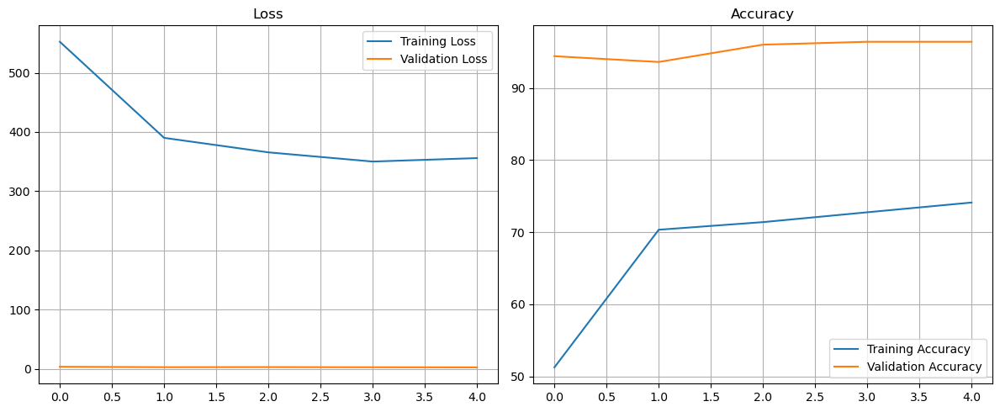

Test Accuracy: 99.20%
Classification Report:
                           precision    recall  f1-score   support

     ARCIGERA FLOWER MOTH       1.00      1.00      1.00         5
               ATLAS MOTH       1.00      1.00      1.00         5
        BANDED TIGER MOTH       1.00      1.00      1.00         5
  BIRD CHERRY ERMINE MOTH       1.00      1.00      1.00         5
        BLACK RUSTIC MOTH       1.00      1.00      1.00         5
             BLAIRS MOCHA       1.00      0.80      0.89         5
    BLOTCHED EMERALD MOTH       1.00      1.00      1.00         5
BLUE BORDERED CARPET MOTH       1.00      1.00      1.00         5
            CINNABAR MOTH       1.00      1.00      1.00         5
           CLEARWING MOTH       1.00      1.00      1.00         5
               COMET MOTH       1.00      1.00      1.00         5
    DEATHS HEAD HAWK MOTH       1.00      1.00      1.00         5
       ELEPHANT HAWK MOTH       1.00      1.00      1.00         5
         EMPEROR

In [34]:
# Import necessary programmes
from pathlib import Path
import os

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tqdm import tqdm
from PIL import Image
import random

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader

from torchvision import transforms, datasets, models
from torchvision.models import MobileNet_V2_Weights
from torchvision.transforms.v2 import CutMix  # Add CutMix import

# Set seed for reproducibility
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# Device - tells PyTorch code to automatically select GPU if available, otherwise use CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define Paths
data_root = Path("../data/kaggle-dataset/archive")

# Implement standard transformations including flips, rotations, and lighting simulation
# note: augmentations are for training only; consistent resizing + normalisation for val/test
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.3, scale=(0.02, 0.15), ratio=(0.3, 3.3)) # Random erasing

])

transform_val_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Dictionary-style dataset and dataloader setup with custom transforms
data_transforms = {
    'train': transform_train,
    'valid': transform_val_test,
    'test': transform_val_test
}

image_datasets = {
    split: datasets.ImageFolder(os.path.join(data_root, split), transform=data_transforms[split])
    for split in ['train', 'valid', 'test']
}

class_names = image_datasets['train'].classes
num_classes = len(class_names)

# CutMix setup
cutmix = CutMix(num_classes=num_classes)

def cutmix_collate(batch):
    imgs, targets = zip(*batch)
    imgs = torch.stack(imgs)
    targets = torch.tensor(targets)
    imgs, targets = cutmix(imgs, targets)
    return imgs, targets

# DataLoaders - only training uses CutMix
dataloaders = {
    'train': DataLoader(image_datasets['train'], batch_size=32, shuffle=True, 
                       num_workers=0, collate_fn=cutmix_collate),  # CutMix for training only
    'valid': DataLoader(image_datasets['valid'], batch_size=32, shuffle=False, num_workers=4),
    'test': DataLoader(image_datasets['test'], batch_size=32, shuffle=False, num_workers=4)
}

# Load MobileNetV2 model with pretrained weights
weights = MobileNet_V2_Weights.DEFAULT
model = models.mobilenet_v2(weights=weights)
# Replace just the final classification layer 
model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)

# unfreeze the last block only
for name, param in model.named_parameters():
    # Unfreeze only features.18 (last block) + classifier
    if "features.18" in name or "classifier" in name:
        param.requires_grad = True
    else:
        param.requires_grad = False

model.to(device)

# Loss and optimiser for calculating error and adjusting for model improvement
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-3, weight_decay=1e-4)

# Training
train_loss_list, val_loss_list = [], []
train_acc_list, val_acc_list = [], []
epochs = 5

for epoch in range(epochs):
    model.train()
    total_loss, total_correct, total_samples = 0, 0, 0

    for x, y in tqdm(dataloaders['train'], desc=f"Epoch {epoch+1}/{epochs}"):
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        output = model(x)
        loss = criterion(output, y)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        total_correct += (output.argmax(1) == y.argmax(1)).sum().item()
        total_samples += y.size(0)

    train_loss_list.append(total_loss)
    train_acc_list.append(100 * total_correct / total_samples)

    model.eval()
    val_loss, val_correct, val_total = 0, 0, 0
    with torch.no_grad():
        for x, y in dataloaders['valid']:
            x, y = x.to(device), y.to(device)
            output = model(x)
            loss = criterion(output, y)
            val_loss += loss.item()
            val_correct += (output.argmax(1) == y).sum().item()
            val_total += y.size(0)

    val_loss_list.append(val_loss)
    val_acc_list.append(100 * val_correct / val_total)

    print(f"Epoch {epoch+1}: Train Acc: {train_acc_list[-1]:.2f}%, Val Acc: {val_acc_list[-1]:.2f}%")

# Plot
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_loss_list, label="Training Loss")
plt.plot(val_loss_list, label="Validation Loss")
plt.legend()
plt.title("Loss")
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(train_acc_list, label="Training Accuracy")
plt.plot(val_acc_list, label="Validation Accuracy")
plt.legend()
plt.title("Accuracy")
plt.grid(True)

plt.tight_layout()
plt.show()

# Test evaluation
model.eval()
all_preds, all_labels = [], []
test_correct, test_total = 0, 0

with torch.no_grad():
    for x, y in dataloaders['test']:
        x, y = x.to(device), y.to(device)
        output = model(x)
        pred = output.argmax(1)
        all_preds.extend(pred.cpu().numpy())
        all_labels.extend(y.cpu().numpy())
        test_correct += (pred == y).sum().item()
        test_total += y.size(0)

print(f"Test Accuracy: {100 * test_correct / test_total:.2f}%")
print("Classification Report:")
print(classification_report(all_labels, all_preds, target_names=class_names))

# Confused pairs
cm = confusion_matrix(all_labels, all_preds)
cm_copy = cm.copy()
np.fill_diagonal(cm_copy, 0)
confused = np.argwhere(cm_copy > 0)

print("Confused Class Pairs:")
for i, (true, pred) in enumerate(confused):
    count = cm[true, pred]
    print(f"{i+1}. True: {class_names[true]} ↔ Pred: {class_names[pred]} ({count} times)")

In [35]:
torch.save(model.state_dict(), "mobilenet_v2_standard_augmentations.pth")

In [105]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_standard_augmentations.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/SQUARE SPOT RUSTIC MOTH/2.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Score-CAM 
cam = ScoreCAM(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2_ft/score-cam-standard-augmentations-square-spot-rustic-2.jpg") 
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 80/80 [00:13<00:00,  5.83it/s]


True

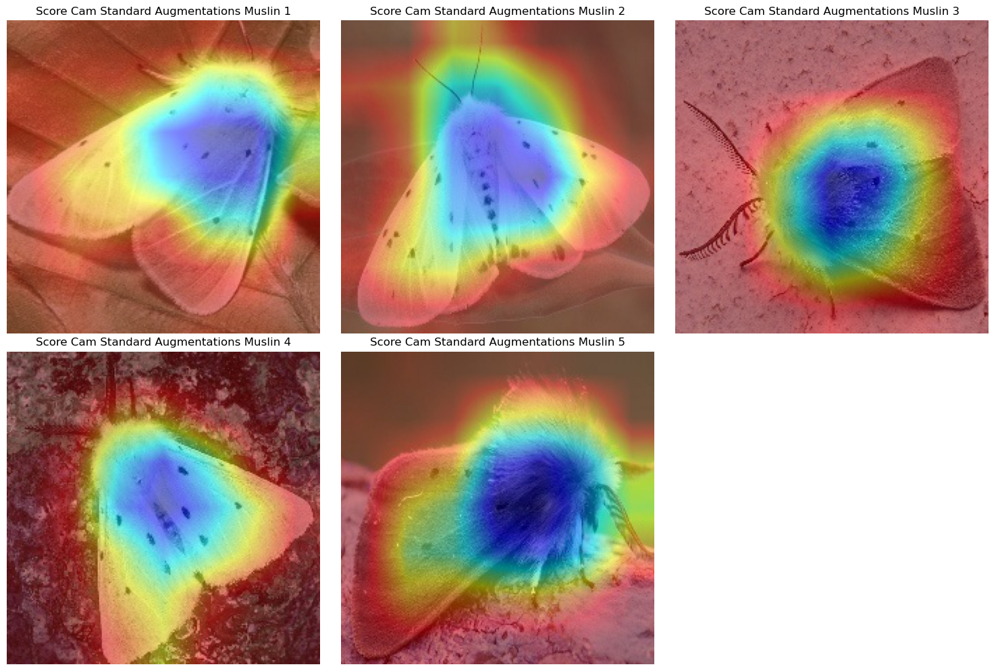

In [48]:
# Directory containing the images
base_path = Path("../cam_outputs/mobilenet_v2_ft") 

# Gather all Score-CAM images for Humming Bird Hawk Moth
image_paths = sorted(base_path.glob("score-cam-standard-augmentations-muslin-*.jpg"))

# Display settings
num_images = len(image_paths)
cols = 3
rows = (num_images + cols - 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))

# Flatten axs for easy indexing
axs = axs.flatten()

for i, ax in enumerate(axs):
    if i < num_images:
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.set_title(image_paths[i].stem.replace("-", " ").title())
    ax.axis('off')

plt.tight_layout()
plt.show()

In [53]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_standard_augmentations.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/EYED HAWK MOTH/5.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Score-CAM 
cam = ScoreCAM(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2_ft/score-cam-standard-augmentations-eyed-hawk-5.jpg") 
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 80/80 [00:12<00:00,  6.46it/s]


True

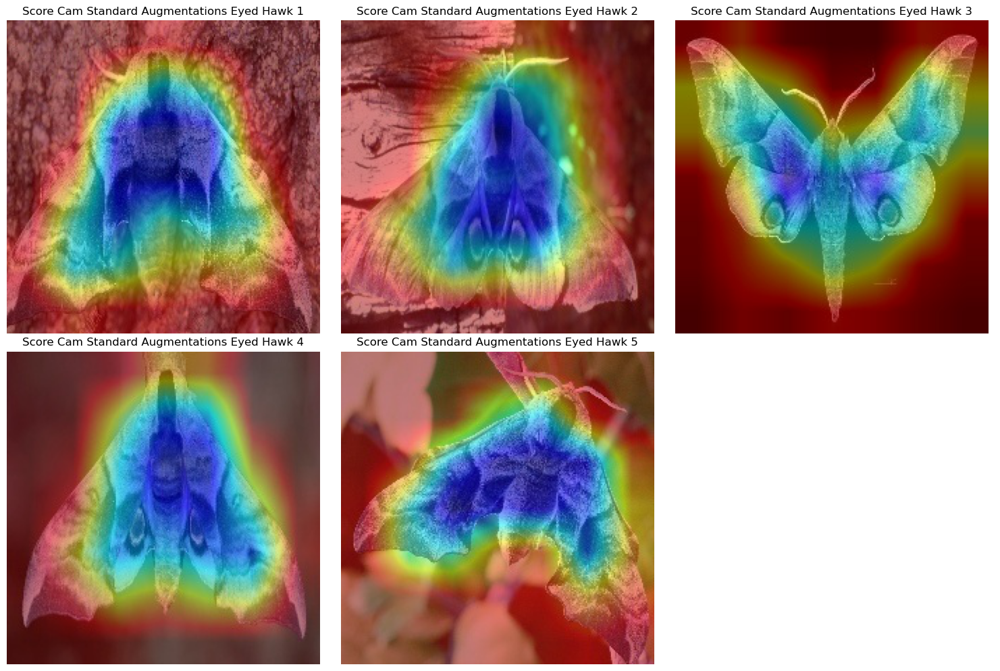

In [54]:
# Directory containing the images
base_path = Path("../cam_outputs/mobilenet_v2_ft") 

# Gather all Score-CAM images for Humming Bird Hawk Moth
image_paths = sorted(base_path.glob("score-cam-standard-augmentations-eyed-hawk-*.jpg"))

# Display settings
num_images = len(image_paths)
cols = 3
rows = (num_images + cols - 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))

# Flatten axs for easy indexing
axs = axs.flatten()

for i, ax in enumerate(axs):
    if i < num_images:
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.set_title(image_paths[i].stem.replace("-", " ").title())
    ax.axis('off')

plt.tight_layout()
plt.show()

Further transformations will be applied to the commonly confused species pairs:

Epoch 1/5: 100%|██████████| 591/591 [08:41<00:00,  1.13it/s]


Epoch 1: Train Acc: 61.52%, Val Acc: 94.00%


Epoch 2/5: 100%|██████████| 591/591 [09:19<00:00,  1.06it/s]


Epoch 2: Train Acc: 71.19%, Val Acc: 94.80%


Epoch 3/5: 100%|██████████| 591/591 [06:24<00:00,  1.54it/s]


Epoch 3: Train Acc: 73.60%, Val Acc: 94.40%


Epoch 4/5: 100%|██████████| 591/591 [07:35<00:00,  1.30it/s]


Epoch 4: Train Acc: 76.22%, Val Acc: 94.00%


Epoch 5/5: 100%|██████████| 591/591 [08:55<00:00,  1.10it/s]


Epoch 5: Train Acc: 74.34%, Val Acc: 94.40%


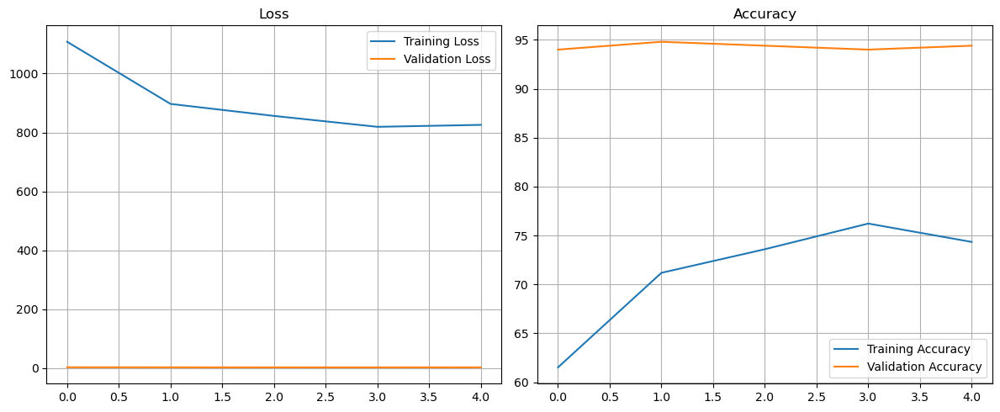

Test Accuracy: 98.80%
Classification Report:
                           precision    recall  f1-score   support

     ARCIGERA FLOWER MOTH       1.00      0.80      0.89         5
               ATLAS MOTH       1.00      1.00      1.00         5
        BANDED TIGER MOTH       0.83      1.00      0.91         5
  BIRD CHERRY ERMINE MOTH       1.00      1.00      1.00         5
        BLACK RUSTIC MOTH       1.00      1.00      1.00         5
             BLAIRS MOCHA       1.00      1.00      1.00         5
    BLOTCHED EMERALD MOTH       0.83      1.00      0.91         5
BLUE BORDERED CARPET MOTH       1.00      1.00      1.00         5
            CINNABAR MOTH       1.00      1.00      1.00         5
           CLEARWING MOTH       1.00      1.00      1.00         5
               COMET MOTH       1.00      1.00      1.00         5
    DEATHS HEAD HAWK MOTH       1.00      1.00      1.00         5
       ELEPHANT HAWK MOTH       1.00      1.00      1.00         5
         EMPEROR

In [55]:
# Import necessary programmes
from pathlib import Path
import os

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tqdm import tqdm
from PIL import Image
import random

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader

from torchvision import transforms, datasets, models
from torchvision.models import MobileNet_V2_Weights
from torchvision.transforms.v2 import CutMix  # Add CutMix import

# Set seed for reproducibility
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# Device - tells PyTorch code to automatically select GPU if available, otherwise use CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define Paths
data_root = Path("../data/targeted_augmented_dataset")

# Implement standard transformations including flips, rotations, and lighting simulation
# note: augmentations are for training only; consistent resizing + normalisation for val/test
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.3, scale=(0.02, 0.15), ratio=(0.3, 3.3)) # Random erasing

])

transform_val_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Dictionary-style dataset and dataloader setup with custom transforms
data_transforms = {
    'train': transform_train,
    'valid': transform_val_test,
    'test': transform_val_test
}

image_datasets = {
    split: datasets.ImageFolder(os.path.join(data_root, split), transform=data_transforms[split])
    for split in ['train', 'valid', 'test']
}

class_names = image_datasets['train'].classes
num_classes = len(class_names)

# CutMix setup
cutmix = CutMix(num_classes=num_classes)

def cutmix_collate(batch):
    imgs, targets = zip(*batch)
    imgs = torch.stack(imgs)
    targets = torch.tensor(targets)
    imgs, targets = cutmix(imgs, targets)
    return imgs, targets

# DataLoaders - only training uses CutMix
dataloaders = {
    'train': DataLoader(image_datasets['train'], batch_size=32, shuffle=True, 
                       num_workers=0, collate_fn=cutmix_collate),  # CutMix for training only
    'valid': DataLoader(image_datasets['valid'], batch_size=32, shuffle=False, num_workers=4),
    'test': DataLoader(image_datasets['test'], batch_size=32, shuffle=False, num_workers=4)
}

# Load MobileNetV2 model with pretrained weights
weights = MobileNet_V2_Weights.DEFAULT
model = models.mobilenet_v2(weights=weights)
# Replace just the final classification layer 
model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)

# unfreeze the last block only
for name, param in model.named_parameters():
    # Unfreeze only features.18 (last block) + classifier
    if "features.18" in name or "classifier" in name:
        param.requires_grad = True
    else:
        param.requires_grad = False

model.to(device)

# Loss and optimiser for calculating error and adjusting for model improvement
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-3, weight_decay=1e-4)

# Training
train_loss_list, val_loss_list = [], []
train_acc_list, val_acc_list = [], []
epochs = 5

for epoch in range(epochs):
    model.train()
    total_loss, total_correct, total_samples = 0, 0, 0

    for x, y in tqdm(dataloaders['train'], desc=f"Epoch {epoch+1}/{epochs}"):
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        output = model(x)
        loss = criterion(output, y)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        total_correct += (output.argmax(1) == y.argmax(1)).sum().item()
        total_samples += y.size(0)

    train_loss_list.append(total_loss)
    train_acc_list.append(100 * total_correct / total_samples)

    model.eval()
    val_loss, val_correct, val_total = 0, 0, 0
    with torch.no_grad():
        for x, y in dataloaders['valid']:
            x, y = x.to(device), y.to(device)
            output = model(x)
            loss = criterion(output, y)
            val_loss += loss.item()
            val_correct += (output.argmax(1) == y).sum().item()
            val_total += y.size(0)

    val_loss_list.append(val_loss)
    val_acc_list.append(100 * val_correct / val_total)

    print(f"Epoch {epoch+1}: Train Acc: {train_acc_list[-1]:.2f}%, Val Acc: {val_acc_list[-1]:.2f}%")

# Plot
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_loss_list, label="Training Loss")
plt.plot(val_loss_list, label="Validation Loss")
plt.legend()
plt.title("Loss")
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(train_acc_list, label="Training Accuracy")
plt.plot(val_acc_list, label="Validation Accuracy")
plt.legend()
plt.title("Accuracy")
plt.grid(True)

plt.tight_layout()
plt.show()

# Test evaluation
model.eval()
all_preds, all_labels = [], []
test_correct, test_total = 0, 0

with torch.no_grad():
    for x, y in dataloaders['test']:
        x, y = x.to(device), y.to(device)
        output = model(x)
        pred = output.argmax(1)
        all_preds.extend(pred.cpu().numpy())
        all_labels.extend(y.cpu().numpy())
        test_correct += (pred == y).sum().item()
        test_total += y.size(0)

print(f"Test Accuracy: {100 * test_correct / test_total:.2f}%")
print("Classification Report:")
print(classification_report(all_labels, all_preds, target_names=class_names))

# Confused pairs
cm = confusion_matrix(all_labels, all_preds)
cm_copy = cm.copy()
np.fill_diagonal(cm_copy, 0)
confused = np.argwhere(cm_copy > 0)

print("Confused Class Pairs:")
for i, (true, pred) in enumerate(confused):
    count = cm[true, pred]
    print(f"{i+1}. True: {class_names[true]} ↔ Pred: {class_names[pred]} ({count} times)")

In [56]:
torch.save(model.state_dict(), "mobilenet_v2_final_augmentations.pth")

Lets look at how the targeted augmentations have helped confused pairs in the mobilenet model:

In [97]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_final_augmentations.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/MUSLIN MOTH/5.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Score-CAM 
cam = ScoreCAM(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2_ft/score-cam-final-augmentations-muslin-5.jpg") 
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 80/80 [00:18<00:00,  4.29it/s]


True

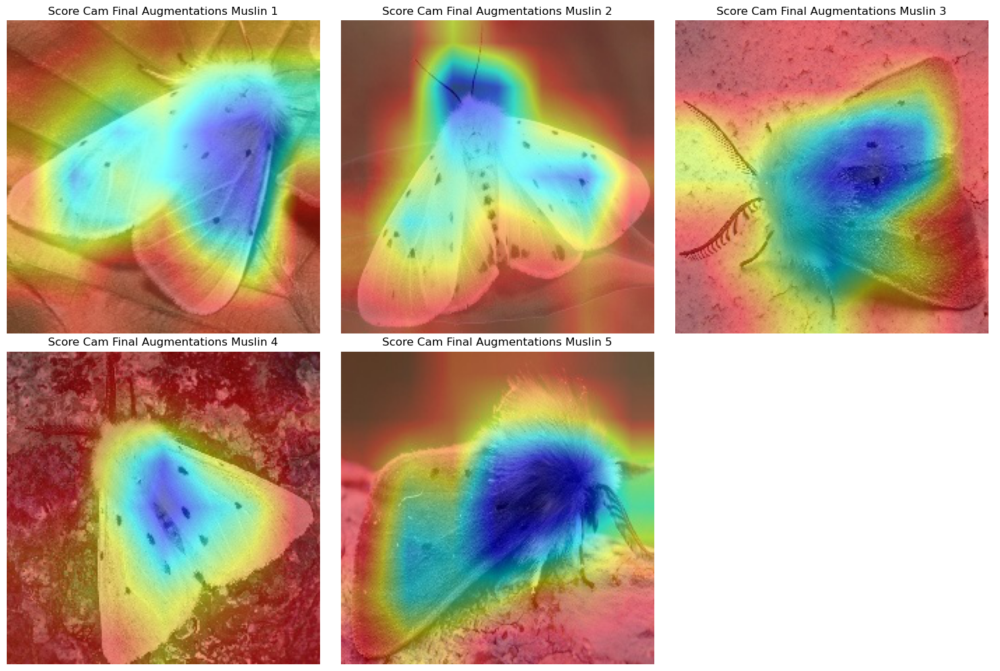

In [98]:
# Directory containing the images
base_path = Path("../cam_outputs/mobilenet_v2_ft") 

# Gather all Score-CAM images for Humming Bird Hawk Moth
image_paths = sorted(base_path.glob("score-cam-final-augmentations-muslin-*.jpg"))

# Display settings
num_images = len(image_paths)
cols = 3
rows = (num_images + cols - 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))

# Flatten axs for easy indexing
axs = axs.flatten()

for i, ax in enumerate(axs):
    if i < num_images:
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.set_title(image_paths[i].stem.replace("-", " ").title())
    ax.axis('off')

plt.tight_layout()
plt.show()

In [103]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_final_augmentations.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/SQUARE SPOT RUSTIC MOTH/5.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Score-CAM 
cam = ScoreCAM(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2_ft/score-cam-final-augmentations-square-spot-rustic-5.jpg") 
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 80/80 [00:18<00:00,  4.34it/s]


True

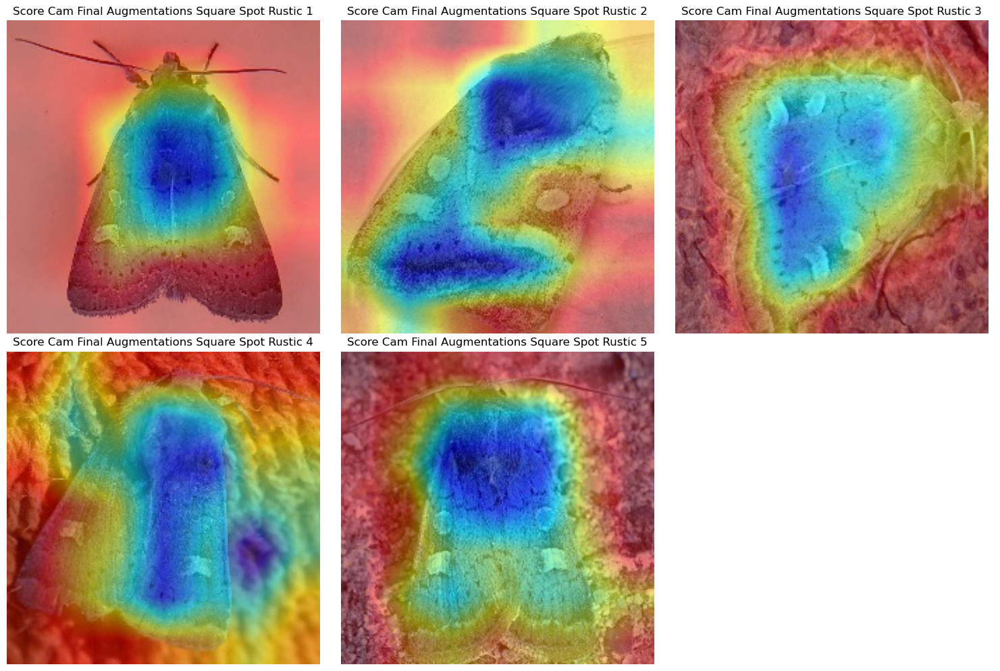

In [104]:
# Directory containing the images
base_path = Path("../cam_outputs/mobilenet_v2_ft") 

# Gather all Score-CAM images for Humming Bird Hawk Moth
image_paths = sorted(base_path.glob("score-cam-final-augmentations-square-spot-rustic-*.jpg"))

# Display settings
num_images = len(image_paths)
cols = 3
rows = (num_images + cols - 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))

# Flatten axs for easy indexing
axs = axs.flatten()

for i, ax in enumerate(axs):
    if i < num_images:
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.set_title(image_paths[i].stem.replace("-", " ").title())
    ax.axis('off')

plt.tight_layout()
plt.show()

For more in-depth fine-tuning, we will unfreeze unfreeze the last two inverted residual blocks along with the classifier. We'll also apply layer-wise learning rates and extended training:

Enhanced fine-tuning: 1,270,130/2,287,922 trainable params (55.5%)


Epoch 1/15: 100%|██████████| 591/591 [14:57<00:00,  1.52s/it]


Epoch 1: Train Acc: 64.58%, Val Acc: 94.00%


Epoch 2/15: 100%|██████████| 591/591 [14:33<00:00,  1.48s/it]


Epoch 2: Train Acc: 73.23%, Val Acc: 96.40%


Epoch 3/15: 100%|██████████| 591/591 [11:02<00:00,  1.12s/it]


Epoch 3: Train Acc: 75.88%, Val Acc: 97.20%


Epoch 4/15: 100%|██████████| 591/591 [08:54<00:00,  1.10it/s]


Epoch 4: Train Acc: 78.00%, Val Acc: 96.00%


Epoch 5/15: 100%|██████████| 591/591 [08:36<00:00,  1.14it/s]


Epoch 5: Train Acc: 76.36%, Val Acc: 96.40%


Epoch 6/15: 100%|██████████| 591/591 [08:17<00:00,  1.19it/s]


Epoch 6: Train Acc: 78.38%, Val Acc: 96.80%


Epoch 7/15: 100%|██████████| 591/591 [08:14<00:00,  1.20it/s]


Epoch 7: Train Acc: 76.36%, Val Acc: 95.60%


Epoch 8/15: 100%|██████████| 591/591 [08:36<00:00,  1.14it/s]


Epoch 8: Train Acc: 78.52%, Val Acc: 97.20%


Epoch 9/15: 100%|██████████| 591/591 [09:30<00:00,  1.04it/s]


Epoch 9: Train Acc: 78.85%, Val Acc: 96.80%


Epoch 10/15: 100%|██████████| 591/591 [11:43<00:00,  1.19s/it]


Epoch 10: Train Acc: 78.78%, Val Acc: 96.80%


Epoch 11/15: 100%|██████████| 591/591 [12:24<00:00,  1.26s/it]


Epoch 11: Train Acc: 78.12%, Val Acc: 96.40%


Epoch 12/15: 100%|██████████| 591/591 [11:17<00:00,  1.15s/it]


Epoch 12: Train Acc: 79.39%, Val Acc: 97.20%


Epoch 13/15: 100%|██████████| 591/591 [10:00<00:00,  1.02s/it]


Epoch 13: Train Acc: 79.71%, Val Acc: 96.40%


Epoch 14/15: 100%|██████████| 591/591 [09:48<00:00,  1.00it/s]


Epoch 14: Train Acc: 79.86%, Val Acc: 97.20%


Epoch 15/15: 100%|██████████| 591/591 [07:52<00:00,  1.25it/s]


Epoch 15: Train Acc: 80.29%, Val Acc: 98.00%


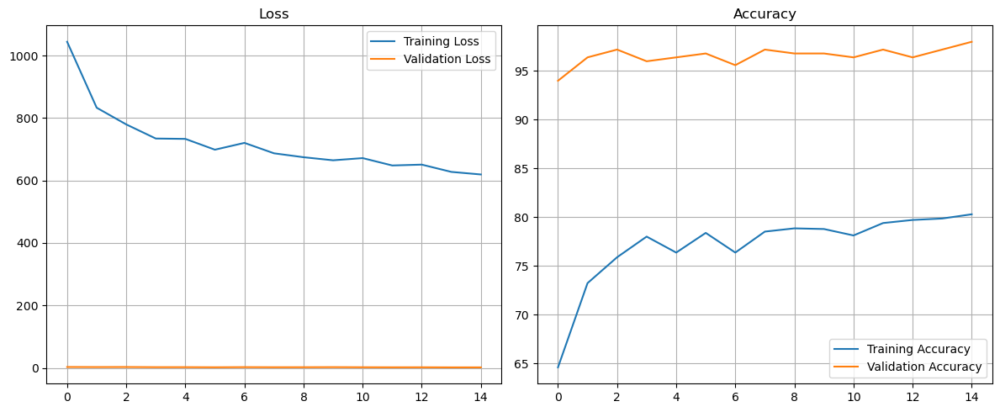

Test Accuracy: 100.00%
Classification Report:
                           precision    recall  f1-score   support

     ARCIGERA FLOWER MOTH       1.00      1.00      1.00         5
               ATLAS MOTH       1.00      1.00      1.00         5
        BANDED TIGER MOTH       1.00      1.00      1.00         5
  BIRD CHERRY ERMINE MOTH       1.00      1.00      1.00         5
        BLACK RUSTIC MOTH       1.00      1.00      1.00         5
             BLAIRS MOCHA       1.00      1.00      1.00         5
    BLOTCHED EMERALD MOTH       1.00      1.00      1.00         5
BLUE BORDERED CARPET MOTH       1.00      1.00      1.00         5
            CINNABAR MOTH       1.00      1.00      1.00         5
           CLEARWING MOTH       1.00      1.00      1.00         5
               COMET MOTH       1.00      1.00      1.00         5
    DEATHS HEAD HAWK MOTH       1.00      1.00      1.00         5
       ELEPHANT HAWK MOTH       1.00      1.00      1.00         5
         EMPERO

In [16]:
# Import necessary programmes
from pathlib import Path
import os
import random
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.optim.lr_scheduler import StepLR

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tqdm import tqdm
from PIL import Image

from torchvision import transforms, datasets, models
from torchvision.models import MobileNet_V2_Weights
from torchvision.transforms.v2 import CutMix  # Add CutMix import

# Set seed for reproducibility
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# Device - tells PyTorch code to automatically select GPU if available, otherwise use CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define Paths
data_root = Path("../data/targeted_augmented_dataset")

# Implement standard transformations including flips, rotations, and lighting simulation
# note: augmentations are for training only; consistent resizing + normalisation for val/test
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.3, scale=(0.02, 0.15), ratio=(0.3, 3.3)) # Random erasing
])

transform_val_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Dictionary-style dataset and dataloader setup with custom transforms
data_transforms = {
    'train': transform_train,
    'valid': transform_val_test,
    'test': transform_val_test
}

image_datasets = {
    split: datasets.ImageFolder(os.path.join(data_root, split), transform=data_transforms[split])
    for split in ['train', 'valid', 'test']
}

class_names = image_datasets['train'].classes
num_classes = len(class_names)

# CutMix setup
cutmix = CutMix(num_classes=num_classes)

def cutmix_collate(batch):
    imgs, targets = zip(*batch)
    imgs = torch.stack(imgs)
    targets = torch.tensor(targets)
    imgs, targets = cutmix(imgs, targets)
    return imgs, targets

# DataLoaders - only training uses CutMix
dataloaders = {
    'train': DataLoader(image_datasets['train'], batch_size=32, shuffle=True, 
                       num_workers=0, collate_fn=cutmix_collate),  # CutMix for training only
    'valid': DataLoader(image_datasets['valid'], batch_size=32, shuffle=False, num_workers=4),
    'test': DataLoader(image_datasets['test'], batch_size=32, shuffle=False, num_workers=4)
}

# Load MobileNetV2 model with pretrained weights
weights = MobileNet_V2_Weights.DEFAULT
model = models.mobilenet_v2(weights=weights)
# Replace just the final classification layer 
model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)

# Deeper unfreezing - unfreeze last 3 feature blocks + classifier
for param in model.parameters():
    param.requires_grad = False
# MobileNetV2 has features.16, features.17, features.18 - unfreeze last 3 blocks
for name, param in model.named_parameters():
    if any(block in name for block in ["features.16", "features.17", "features.18"]) or "classifier" in name:
        param.requires_grad = True

model.to(device)

# Discriminative learning rates setup
base_lr = 1e-3
param_groups = []

# Group parameters by feature blocks
for name, param in model.named_parameters():
    if param.requires_grad:
        if "features.16" in name:
            param_groups.append({'params': [param], 'lr': base_lr * 0.1})  # Conservative
        elif "features.17" in name:
            param_groups.append({'params': [param], 'lr': base_lr * 0.5})  # Moderate
        elif "features.18" in name:
            param_groups.append({'params': [param], 'lr': base_lr * 0.8})  # Aggressive
        elif "classifier" in name:
            param_groups.append({'params': [param], 'lr': base_lr})        # Most aggressive

optimizer = optim.Adam(param_groups, weight_decay=1e-4)
scheduler = StepLR(optimizer, step_size=7, gamma=0.5)

# Count trainable parameters for reference
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Enhanced fine-tuning: {trainable_params:,}/{total_params:,} trainable params ({100*trainable_params/total_params:.1f}%)")

# Loss and optimiser for calculating error and adjusting for model improvement
criterion = nn.CrossEntropyLoss()

# Training
train_loss_list, val_loss_list = [], []
train_acc_list, val_acc_list = [], []
epochs = 15

for epoch in range(epochs):
    model.train()
    total_loss, total_correct, total_samples = 0, 0, 0

    for x, y in tqdm(dataloaders['train'], desc=f"Epoch {epoch+1}/{epochs}"):
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        output = model(x)
        loss = criterion(output, y)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        total_correct += (output.argmax(1) == y.argmax(1)).sum().item()
        total_samples += y.size(0)

    train_loss_list.append(total_loss)
    train_acc_list.append(100 * total_correct / total_samples)

    model.eval()
    val_loss, val_correct, val_total = 0, 0, 0
    with torch.no_grad():
        for x, y in dataloaders['valid']:
            x, y = x.to(device), y.to(device)
            output = model(x)
            loss = criterion(output, y)
            val_loss += loss.item()
            val_correct += (output.argmax(1) == y).sum().item()
            val_total += y.size(0)

    val_loss_list.append(val_loss)
    val_acc_list.append(100 * val_correct / val_total)

    print(f"Epoch {epoch+1}: Train Acc: {train_acc_list[-1]:.2f}%, Val Acc: {val_acc_list[-1]:.2f}%")
    
    # Step the scheduler
    scheduler.step()

# Plot
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_loss_list, label="Training Loss")
plt.plot(val_loss_list, label="Validation Loss")
plt.legend()
plt.title("Loss")
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(train_acc_list, label="Training Accuracy")
plt.plot(val_acc_list, label="Validation Accuracy")
plt.legend()
plt.title("Accuracy")
plt.grid(True)

plt.tight_layout()
plt.show()

# Test evaluation
model.eval()
all_preds, all_labels = [], []
test_correct, test_total = 0, 0

with torch.no_grad():
    for x, y in dataloaders['test']:
        x, y = x.to(device), y.to(device)
        output = model(x)
        pred = output.argmax(1)
        all_preds.extend(pred.cpu().numpy())
        all_labels.extend(y.cpu().numpy())
        test_correct += (pred == y).sum().item()
        test_total += y.size(0)

print(f"Test Accuracy: {100 * test_correct / test_total:.2f}%")
print("Classification Report:")
print(classification_report(all_labels, all_preds, target_names=class_names))

# Confused pairs
cm = confusion_matrix(all_labels, all_preds)
cm_copy = cm.copy()
np.fill_diagonal(cm_copy, 0)
confused = np.argwhere(cm_copy > 0)

print("Confused Class Pairs:")
for i, (true, pred) in enumerate(confused):
    count = cm[true, pred]
    print(f"{i+1}. True: {class_names[true]} ↔ Pred: {class_names[pred]} ({count} times)")

In [17]:
torch.save(model.state_dict(), "mobilenet_v2_final_finetuning.pth")

In [85]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_final_finetuning.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/BANDED TIGER MOTH/1.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Score-CAM 
cam = ScoreCAM(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2_ft/score-cam-final-finetuning-banded-tiger-1.jpg") 
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 80/80 [00:18<00:00,  4.43it/s]


True

In [86]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_final_finetuning.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/GARDEN TIGER MOTH/1.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Score-CAM 
cam = ScoreCAM(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2_ft/score-cam-final-finetuning-garden-tiger-1.jpg") 
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 80/80 [00:17<00:00,  4.50it/s]


True

In [87]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_final_finetuning.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/HUMMING BIRD HAWK MOTH/1.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
]) 

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Score-CAM 
cam = ScoreCAM(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2_ft/score-cam-final-finetuning-humming-bird-hawk-1.jpg") 
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 80/80 [00:22<00:00,  3.55it/s]


True

In [88]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_final_finetuning.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/EYED HAWK MOTH/1.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Score-CAM 
cam = ScoreCAM(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2_ft/score-cam-final-finetuning-eyed-hawk-1.jpg") 
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 80/80 [00:16<00:00,  4.91it/s]


True

In [89]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_final_finetuning.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/MUSLIN MOTH/1.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
]) 

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Score-CAM 
cam = ScoreCAM(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2_ft/score-cam-final-finetuning-muslin-1.jpg") 
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 80/80 [00:17<00:00,  4.54it/s]


True

In [90]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_final_finetuning.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/SQUARE SPOT RUSTIC MOTH/1.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Score-CAM 
cam = ScoreCAM(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2_ft/score-cam-final-finetuning-square-spot-rustic-1.jpg") 
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 80/80 [00:17<00:00,  4.57it/s]


True

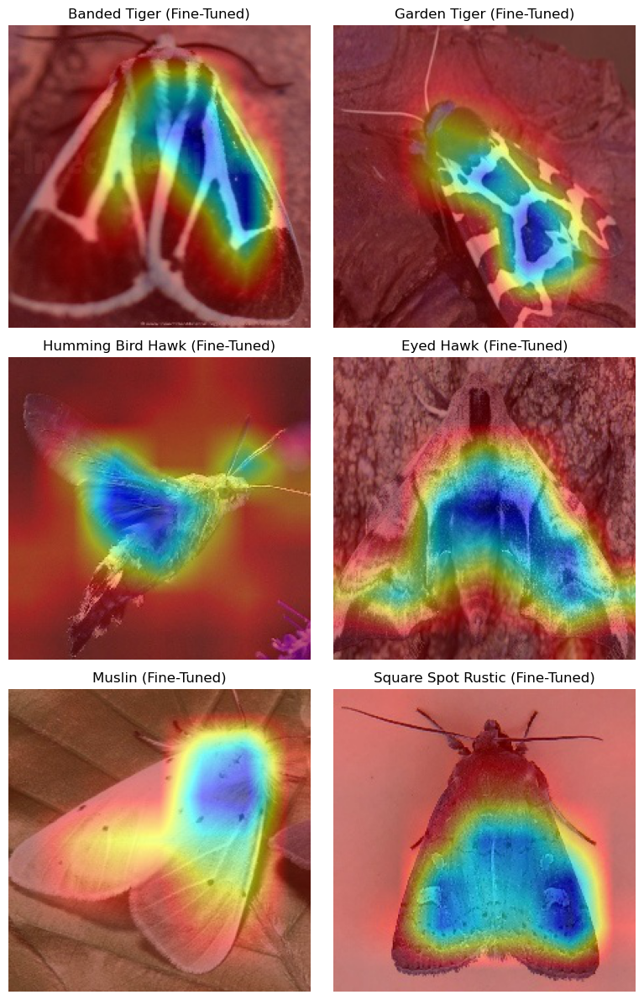

In [92]:
# Define species pairs (based on original confusion)
species_pairs = [
    ("banded-tiger", "garden-tiger"),
    ("humming-bird-hawk", "eyed-hawk"),
    ("muslin", "square-spot-rustic")
]

# Set the base directory for fine-tuned Grad-CAM++ outputs
base_path = Path("../cam_outputs/mobilenet_v2_ft")

# Set up plot
fig, axs = plt.subplots(len(species_pairs), 2, figsize=(8, len(species_pairs) * 4))

# Loop through each pair and display the first fine-tuned CAM image for each
for i, (sp1, sp2) in enumerate(species_pairs):
    img1 = mpimg.imread(base_path / f"score-cam-final-finetuning-{sp1}-1.jpg")
    img2 = mpimg.imread(base_path / f"score-cam-final-finetuning-{sp2}-1.jpg")

    axs[i, 0].imshow(img1)
    axs[i, 0].axis('off')
    axs[i, 0].set_title(f"{sp1.replace('-', ' ').title()} (Fine-Tuned)")

    axs[i, 1].imshow(img2)
    axs[i, 1].axis('off')
    axs[i, 1].set_title(f"{sp2.replace('-', ' ').title()} (Fine-Tuned)")

plt.tight_layout()
plt.show()
